In [1]:
# required for timing functions
from __future__ import print_function, division
# basic python includes 
import struct
import os
import math
import inspect
import re
import timeit
import time
from contextlib import contextmanager
from functools import partial
# numpy and some basic functions
import numpy as np
from numpy import pi, exp, sqrt
# imports required for 2d and 3d plotting
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import style
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import axes3d
from mpl_toolkits.mplot3d.art3d import Poly3DCollection 
from mpl_toolkits.axes_grid1 import make_axes_locatable
#scipy optimization functions
from scipy import optimize
from scipy.spatial import ConvexHull
from scipy.interpolate import griddata
from scipy.optimize import minimize
from scipy.optimize import basinhopping
from scipy.optimize import Bounds
from scipy.optimize import LinearConstraint
from scipy.optimize import SR1
from scipy.integrate import dblquad
from matplotlib.colors import LogNorm
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as mticker
from numpy import sin, cos, tan, log, arcsin, arccos, sqrt
from bqplot import *
import pandas as pd
from tqdm.notebook import trange, tqdm
import random
import warnings
import yaml
%matplotlib notebook
warnings.filterwarnings(action='once')

import time
import torch
from torch_geometric.loader import DataLoader
# from tqdm import trange, tqdm
import argparse
import yaml
from torch_geometric.nn import radius
from torch.optim import Adam
import torch.autograd.profiler as profiler
from torch.profiler import profile, record_function, ProfilerActivity
import os

from rbfConv import RbfConv
from dataset import compressedFluidDataset, prepareData

import inspect
import re
def debugPrint(x):
    frame = inspect.currentframe().f_back
    s = inspect.getframeinfo(frame).code_context[0]
    r = re.search(r"\((.*)\)", s).group(1)
    print("{} [{}] = {}".format(r,type(x).__name__, x))


In [2]:

import random 
import numpy as np

seed= 0

random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
# print(torch.cuda.device_count())
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# print('running on: ', device)
torch.set_num_threads(1)

In [3]:
basePath = '~/servus03/dev/rbfConvolution/output'
basePath = os.path.expanduser(basePath)

In [4]:
configFiles = [basePath + '/' + f for f in os.listdir(basePath) if f.endswith('.yaml')]

In [5]:
def parseData(config, key, norm = 0):
    lossTerms = 0
    testing = []
    for fwd in config[key]:
        epoch = fwd
        epochDict = {}
        k = config[key][fwd]
        for f in k:
            timestep = f
            split = timestep.strip().split(' ')
            index = int(split[0])
            dataset = int(split[2])
            step = int(split[3])
            loss = k[f]
            if dataset not in epochDict:
                epochDict[dataset] = {}
            if isinstance(loss, list):
                epochDict[dataset][step] = loss[norm]
                lossTerms = len(loss)
            else:
                epochDict[dataset][step] = float(loss)
        testing.append(epochDict)
#         print(epochDict)
#         break
    return testing, lossTerms

def pivotData(dataset):
    dataDict = {}
    for e, epoch in enumerate(dataset):
#         print('epoch: ', e)
        for scenario in epoch:
            if scenario not in dataDict:
                dataDict[scenario] = {}
#             print('scenario', scenario)
            for timestep in epoch[scenario]:
                t = epoch[scenario][timestep]
                if timestep not in dataDict[scenario]:
                    dataDict[scenario][timestep] = []
                dataDict[scenario][timestep].append(t)
#                 print('timestep', t, timestep)
#             break
#     print('dict:', dataDict)
#         break
    return dataDict

def getMedian(data):
    scenarioData = []
    for scenario in data:
#         print(scenario)
        npArr = np.array([data[scenario][t] for t in data[scenario]])
        median = np.median(npArr, axis = 0)
        mean = np.mean(npArr, axis = 0)
        mi = np.min(npArr, axis = 0)
        ma = np.max(npArr, axis = 0)
        dev = np.std(npArr, axis = 0)
        q1 = np.percentile(npArr, 25, axis =0)
        q3 = np.percentile(npArr, 75, axis =0)
        scenarioData.append([median,mean,mi,ma,dev,q1,q3])
    return np.array(scenarioData)

In [6]:
def parseDataset(path, plot = False):  
#     print(path)
    with open(path, "r") as stream:
        try:
            config = yaml.safe_load(stream)
        except yaml.YAMLError as exc:
            print(exc)
    if plot:
        print('Config for basis functions %s and kernel size %2d' % (config['rbf'], config['kernel_size']))
        print('Learning config: lr, %1.3e batchSize %3d, data cutooff %4d' %(config['lr'], config['batch_size'], config['cutoff']))
        print('Trained for %3d epochs'% config['epochs'])
        print('Started training at %s' % config['time'])
        print('Trained for %s' % config['compute_time'])
#     return config['rbf'], config['kernel_size'], config['epochs'], [], [], []

        
    training, norms = parseData(config, 'z_forward')
    validation, _ = parseData(config, 'z_validation')
    testing, _ = parseData(config, 'z_testing')
    training = pivotData(training)
    validation = pivotData(validation)
    testing = pivotData(testing)

    trainingLoss = getMedian(training)
    validationLoss = getMedian(validation)
    testingLoss = getMedian(testing)
    
    t = []
    v = []
    s = []
    if norms > 0:
        for n in range(norms):
            training, norms = parseData(config, 'z_forward',n)
            validation, _ = parseData(config, 'z_validation',n)
            testing, _ = parseData(config, 'z_testing',n)
            training = pivotData(training)
            validation = pivotData(validation)
            testing = pivotData(testing)

            trainingLoss = getMedian(training)
            validationLoss = getMedian(validation)
            testingLoss = getMedian(testing)
            t.append(trainingLoss)
            v.append(validationLoss)
            s.append(testingLoss)
        
        
    if(plot):
        fig, axis = plt.subplot_mosaic(
            """
            AAA
            BCD
            """, 
            constrained_layout=True, figsize=(9,9),
            gridspec_kw={
                "height_ratios": [2, 1],
                "width_ratios": [1, 1, 1],
            },)

        for scenario in training:
            for timestep in training[scenario]:
                axis['B'].plot(training[scenario][timestep], label = '%1d - %4d' %(scenario, timestep))
            npArr = np.array([training[scenario][t] for t in training[scenario]])
            axis['A'].plot(np.median(npArr, axis = 0), label = 'Training %1d' % scenario, ls='-')

        for scenario in validation:
            for timestep in validation[scenario]:
                axis['C'].plot(validation[scenario][timestep], label = '%1d - %4d' %(scenario, timestep))
            npArr = np.array([validation[scenario][t] for t in validation[scenario]])
            axis['A'].plot(np.median(npArr, axis = 0), label = 'Validation %1d' % scenario, ls='--')

        for scenario in testing:
            for timestep in testing[scenario]:
                axis['D'].plot(testing[scenario][timestep], label = '%1d - %4d' %(scenario, timestep))
            npArr = np.array([testing[scenario][t] for t in testing[scenario]])
            axis['A'].plot(np.median(npArr, axis = 0), label = 'Testing %1d' % scenario, ls=':')

        fig.suptitle('Training for basis %s, kernel %2d, Epochs %2d' %(config['rbf'], config['kernel_size'], config['epochs']))        

        axis['A'].set_title('Learning Progress')
        axis['A'].legend()
        axis['A'].set_yscale('log')
        axis['A'].grid(which='both')
        axis['A'].set_xlabel('Epoch')
        axis['A'].set_ylabel('Loss')

        axis['B'].set_title('Training Data')
        axis['B'].set_yscale('log')
        axis['B'].grid(which='both')
        axis['B'].set_xlabel('Epoch')
        axis['B'].set_ylabel('Loss')

        axis['C'].set_title('Validation Data')
        axis['C'].set_yscale('log')
        axis['C'].grid(which='both')
        axis['C'].set_xlabel('Epoch')

        axis['D'].set_title('Testing Data')
        axis['D'].set_yscale('log')
        axis['D'].grid(which='both')
        axis['D'].set_xlabel('Epoch')
    descr = config['layerDescription'] if 'layerDescription' in config else '''
Layers:
    - inFeatures: 3
      outFeatures: 16
      dimension: 2
      bias: False
      centerLayer: True
      periodic: False
      activation: relu
    - inFeatures: 16
      outFeatures: 32
      dimension: 2
      bias: False
      centerLayer: True
      periodic: False
      activation: relu
    - inFeatures: 32
      outFeatures: 32
      dimension: 2
      bias: False
      centerLayer: True
      periodic: False
      activation: relu
    - inFeatures: 32
      outFeatures: 2
      dimension: 2
      bias: False
      centerLayer: True
      periodic: False
'''
    arch = config['arch'] if 'arch' in config else '16 32 32 2'
    return config['rbf'], config['kernel_size'], config['epochs'], trainingLoss, validationLoss, testingLoss, descr, arch, config, t, v, s

In [7]:
configFiles.sort()

In [8]:
for ic, c in enumerate(configFiles):
    print(ic, c)

0 /home/winchenbach/servus03/dev/rbfConvolution/output/2022-10-19_13-30-26 - rbf rbf linear x rbf linear - epochs    1 - size    8 - batch    1 - seed   42 - arch 16 32 32 2.yaml


In [9]:
configID = 0

Config for basis functions ['rbf linear', 'rbf linear'] and kernel size  8
Learning config: lr, 1.000e-03 batchSize   1, data cutooff  100
Trained for   1 epochs
Started training at 2022-10-19_13-30-26
Trained for 11.352566425688565


<IPython.core.display.Javascript object>


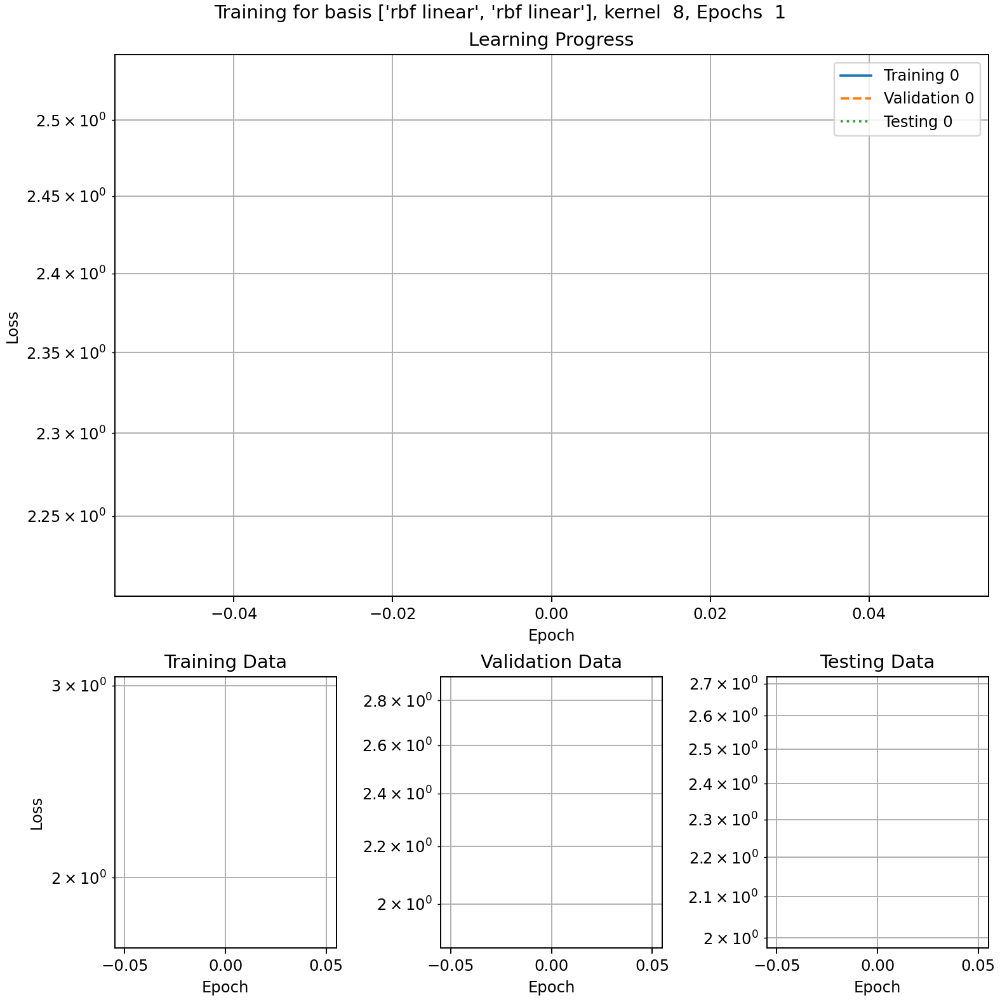

In [10]:
rbfs, ks, epochs, training, validation, testing, layerDescription, arch, config, t, v ,s = parseDataset(configFiles[configID], plot = True)

In [11]:
forwardBatch = 32
backwardBatch = 32
n = ks
rbf_x = rbfs[0]
rbf_y = rbfs[1]

In [12]:
class RbfNet(torch.nn.Module):
    def __init__(self, inputDimensions, outputDimensions, layerDescription):
        super().__init__()
        self.convs = torch.nn.ModuleList()

        outFeatures = inputDimensions
        for layer in layerDescription['Layers']:
            inFeatures = layer['inFeatures'] if 'inFeatures' in layer else outFeatures
            outFeatures = layer['outFeatures'] if 'outFeatures' in layer else outputDimensions
            dimension = layer['dimension'] if 'dimension' in layer else 2
            size = layer['size'] if 'size' in layer else n
            rbf = layer['rbf'] if 'rbf' in layer else [rbf_x, rbf_y]
            bias = layer['bias'] if 'bias' in layer else False
            centerLayer = layer['centerLayer'] if 'centerLayer' in layer else False
            periodic = layer['periodic'] if 'periodic' in layer else False
            activation = layer['activation'] if 'activation' in layer else None
            batchSize = layer['batchSize'] if 'batchSize' in layer else [forwardBatch, backwardBatch]

            self.convs.append(RbfConv(
                in_channels = inFeatures, out_channels = outFeatures,
                dim = dimension, size = size,
                rbf = rbf, periodic = periodic,
                dense_for_center = centerLayer, bias = bias, activation = activation,
                batch_size = batchSize))

    def forward(self, positions, features, output, ghostIndices, support, batches = None, persistent_batches = None):
        if batches == None:
            ghosts = ghostIndices[ghostIndices != -1]

            row, col = radius(output, positions, support, max_num_neighbors = 256)
            edge_index = torch.stack([row, col], dim = 0)

            pseudo = (output[edge_index[1]] - positions[edge_index[0]])
            pseudo = pseudo.clamp(-1,1)

            ans = features

            for layer in self.convs:
                ans = (ans, ans[ghostIndices == -1])

                ansc = layer(ans, edge_index, pseudo)
                ghostFeatures = torch.index_select(ansc, 0, ghosts)
                ans = torch.concat([ansc, ghostFeatures], axis =0)
            return ans
        else:
            ghosts = ghostIndices[ghostIndices != -1]
            row, col = radius(output, positions, support, max_num_neighbors = 256, batch_y = batches, batch_x = persistent_batches)
            edge_index = torch.stack([row, col], dim = 0)
            pseudo = (output[edge_index[1]] - positions[edge_index[0]])
            pseudo = pseudo.clamp(-1,1)
            ans = features
            for layer in self.convs:
                ans = (ans, ans[ghostIndices == -1])

                ansc = layer(ans, edge_index, pseudo)
                ghostFeatures = torch.index_select(ansc, 0, ghosts)
                ans = torch.concat([ansc, ghostFeatures], axis =0)
            return ans


In [13]:

# layerDescription = yaml.load('''
# Layers:
#     - inFeatures: 1
#       outFeatures: 1
#       dimension: 2
#       bias: False
#       centerLayer: False
#       periodic: False
# ''', Loader = yaml.Loader)

# layerDescription = yaml.load('''
# Layers:
#     - inFeatures: 3
#       outFeatures: 16
#       dimension: 2
#       bias: False
#       centerLayer: True
#       periodic: False
#       activation: relu
#     - inFeatures: 16
#       outFeatures: 32
#       dimension: 2
#       bias: False
#       centerLayer: True
#       periodic: False
#       activation: relu
#     - inFeatures: 32
#       outFeatures: 32
#       dimension: 2
#       bias: False
#       centerLayer: True
#       periodic: False
#       activation: relu
#     - inFeatures: 32
#       outFeatures: 2
#       dimension: 2
#       bias: False
#       centerLayer: True
#       periodic: False
# ''', Loader = yaml.Loader)


model = RbfNet(1,1, layerDescription)

In [14]:
configFiles[configID]

'/home/winchenbach/servus03/dev/rbfConvolution/output/2022-10-19_13-30-26 - rbf rbf linear x rbf linear - epochs    1 - size    8 - batch    1 - seed   42 - arch 16 32 32 2.yaml'

In [15]:
from pathlib import Path
p = Path(configFiles[configID])
p = p.with_suffix('.torch')

In [16]:
model.load_state_dict(torch.load(p))
model.eval()
model.to(device)

RbfNet(
  (convs): ModuleList(
    (0): RbfConv(6, 16, dim=2)
    (1): RbfConv(16, 32, dim=2)
    (2): RbfConv(32, 32, dim=2)
    (3): RbfConv(32, 2, dim=2)
  )
)

In [17]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print('Number of parameters', count_parameters(model))

Number of parameters 110240


In [23]:
dataset = compressedFluidDataset('~/sphdata/', train = False,  test = False, split = False, cutoff = 400)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True).batch_sampler

In [24]:

from dataset import compressedFluidDataset, prepareData

In [25]:
positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([320], dataset, device)

In [26]:
print(features.shape)

torch.Size([19504, 6])


In [27]:
out = model(positions, features, persistent_output,
                    ghostIndices, support, batches, persistent_batches)
loss = (gt - out)**2 / 2

In [28]:
from datetime import datetime

In [29]:
timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
imageFolder = '/home/winchenbach/Desktop/' + timestamp

if not os.path.exists(imageFolder):
    os.makedirs(imageFolder)
from IPython.display import clear_output
#     imagePath = imageFolder + ('/%04d.png' % frameIndex)
#     plt.savefig(imagePath, dpi = 200)
#     plt.clf()
#     clear_output(wait = True)

<IPython.core.display.Javascript object>


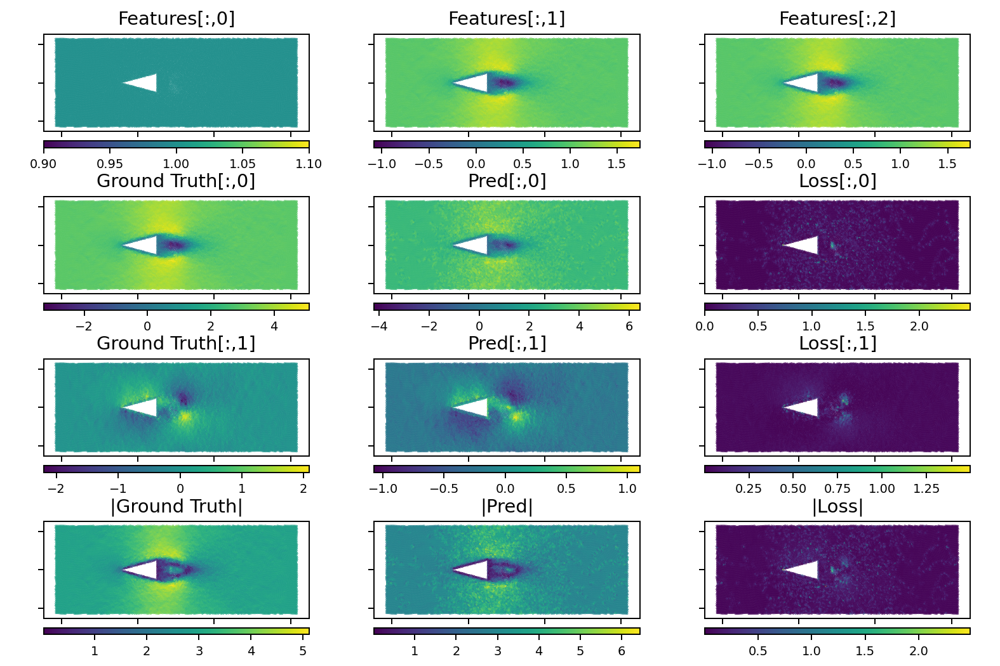

In [32]:
# frameIndex = 320
# for f in tqdm(dataloader):
frameIndex = 320
fig, axis = plt.subplots(4, 3, figsize=(9,6), sharex = True, sharey = True, squeeze = False)

positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([frameIndex], dataset, device)

cpu_positions = positions.to('cpu')

def scatter(ax, data, label):
    sc = ax.scatter(cpu_positions[:,0], cpu_positions[:,1], c = data,s=0.1)
    ax.axis('equal')
    ax.set_title(label)
    ax1_divider = make_axes_locatable(ax)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    cax1 = ax1_divider.append_axes("bottom", size="7%", pad="10%")
    cb1 = fig.colorbar(sc, cax=cax1,orientation='horizontal')
    cb1.ax.tick_params(labelsize=8) 

out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)

loss = (out - gt)**2 / 2
# print(torch.norm(out - gt, 1))
# print(torch.norm(out - gt, 2))
# print(torch.norm(out - gt, float('inf')))

# loss = torch.norm(out - gt, 1)

# loss = torch.linalg.norm(gt,axis=1).detach().cpu() / torch.linalg.norm(out,axis=1).detach().cpu()

# loss = loss / out

scatter(axis[0,0], features[:,0].detach().cpu(), 'Features[:,0]')
scatter(axis[0,1], features[:,1].detach().cpu(), 'Features[:,1]')
scatter(axis[0,2], features[:,1].detach().cpu(), 'Features[:,2]')

scatter(axis[1,0], gt[:,0].detach().cpu(), 'Ground Truth[:,0]')
scatter(axis[2,0], gt[:,1].detach().cpu(), 'Ground Truth[:,1]')
scatter(axis[3,0], torch.linalg.norm(gt,axis=1).detach().cpu(), '|Ground Truth|')

scatter(axis[1,1], out[:,0].detach().cpu(), 'Pred[:,0]')
scatter(axis[2,1], out[:,1].detach().cpu(), 'Pred[:,1]')
scatter(axis[3,1], torch.linalg.norm(out,axis=1).detach().cpu(), '|Pred|')

scatter(axis[1,2], loss[:,0].detach().cpu(), 'Loss[:,0]')
scatter(axis[2,2], loss[:,1].detach().cpu(), 'Loss[:,1]')
scatter(axis[3,2], torch.linalg.norm(loss,axis=1).detach().cpu(), '|Loss|')

fig.tight_layout()
#     break
# imagePath = imageFolder + ('/%04d.png' % frameIndex)
# plt.savefig(imagePath, dpi = 200)
# plt.clf()
# clear_output(wait = True)

In [33]:
print(torch.mean(loss))
# print(torch.max(out - gt))
# print(torch.max(gt))

tensor(0.0003, device='cuda:0', grad_fn=<MeanBackward0>)


In [34]:
0.2977**2/2

0.044312645000000005

In [35]:
dt = 0.005

In [36]:
predicted_velocity = (out - positions[:,:2]) / dt

In [37]:
def filterVirtualParticles(positions, features):
    indices = torch.arange(positions.shape[0], dtype=torch.int64).to(device)
    virtualMin = [-1.00595093332257,  -1.00595093332257]
    virtualMax = [ 1.0173663963512174, 1.0173663963512174]
    indices[positions[:,0] < virtualMin[0]] = -1
    indices[positions[:,1] < virtualMin[1]] = -1
    indices[positions[:,0] > virtualMax[0]] = -1
    indices[positions[:,1] > virtualMax[1]] = -1
    
    indices = indices[indices != -1].to('cpu')
    
    return positions[indices,:], features[indices,:], indices
    

In [38]:
positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([0], dataset, device)


In [39]:
filteredPositions, filteredFeatures, filterIndices = filterVirtualParticles(positions, features)

In [40]:
# print(filteredPositions.shape, filteredPositions)
# print(persistent_output.shape, persistent_output)
# print(torch.sum(filteredPositions - persistent_output))

In [41]:
def createGhostParticles(positions, features):
    indices = torch.arange(positions.shape[0], dtype=torch.int64).to(positions.device)
    virtualMin = [-1.00595093332257,  -1.00595093332257]
    virtualMax = [ 1.0173663963512174, 1.0152778651920848]
    
    mask_xp = positions[:,0] > virtualMax[0] - 2 * support
    mask_xn = positions[:,0] < virtualMin[0] + 2 * support
    mask_yp = positions[:,1] > virtualMax[1] - 2 * support
    mask_yn = positions[:,1] < virtualMin[1] + 2 * support

    filter_xp = indices[mask_xp]
    filter_xn = indices[mask_xn]
    filter_yp = indices[mask_yp]
    filter_yn = indices[mask_yn]
    
    mask_xp_yp = torch.logical_and(mask_xp, mask_yp)
    mask_xp_yn = torch.logical_and(mask_xp, mask_yn)
    mask_xn_yp = torch.logical_and(mask_xn, mask_yp)
    mask_xn_yn = torch.logical_and(mask_xn, mask_yn)
    
    filter_xp_yp = indices[torch.logical_and(mask_xp, mask_yp)]
    filter_xp_yn = indices[torch.logical_and(mask_xp, mask_yn)]
    filter_xn_yp = indices[torch.logical_and(mask_xn, mask_yp)]
    filter_xn_yn = indices[torch.logical_and(mask_xn, mask_yn)]
    
    main = filter_xp.shape[0] + filter_xn.shape[0] + filter_yp.shape[0] + filter_yn.shape[0]
    corner = filter_xp_yp.shape[0] + filter_xp_yn.shape[0] + filter_xn_yp.shape[0] + filter_xn_yn.shape[0]
    
    ghosts_xp = positions[filter_xp,:]
    ghosts_xp[:,0] -=  virtualMax[0] - virtualMin[0]

    ghosts_yp = positions[filter_yp,:]
    ghosts_yp[:,1] -=  virtualMax[1] - virtualMin[1]

    ghosts_xn = positions[filter_xn,:]
    ghosts_xn[:,0] +=  virtualMax[0] - virtualMin[0]

    ghosts_yn = positions[filter_yn,:]
    ghosts_yn[:,1] +=  virtualMax[1] - virtualMin[1]


    ghosts_xp_yp = positions[filter_xp_yp,:]
    ghosts_xp_yp[:,0] -=  virtualMax[0] - virtualMin[0]
    ghosts_xp_yp[:,1] -=  virtualMax[0] - virtualMin[0]

    ghosts_xp_yn = positions[filter_xp_yn,:]
    ghosts_xp_yn[:,0] -=  virtualMax[0] - virtualMin[0]
    ghosts_xp_yn[:,1] +=  virtualMax[0] - virtualMin[0]

    ghosts_xn_yp = positions[filter_xn_yp,:]
    ghosts_xn_yp[:,0] +=  virtualMax[0] - virtualMin[0]
    ghosts_xn_yp[:,1] -=  virtualMax[0] - virtualMin[0]

    ghosts_xn_yn = positions[filter_xn_yn,:]
    ghosts_xn_yn[:,0] +=  virtualMax[0] - virtualMin[0]
    ghosts_xn_yn[:,1] +=  virtualMax[0] - virtualMin[0]
    
#     debugPrint(indices.dtype)
#     debugPrint(indices.dtype)
    
    def stackData(ghosts, mask, oldPositions, oldFeatures, oldIndices, actualFeatures, indices):
        tempPositions = torch.vstack((oldPositions, ghosts))
        tempFeatures = torch.vstack((oldFeatures, actualFeatures[mask,:]))
        tempIndices = torch.cat((oldIndices, indices[mask]))
    
        return tempPositions, tempFeatures, tempIndices
    ghostIndices = positions.new_ones(positions.shape[0], dtype=torch.int64) * -1
    
    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_xp, mask_xp, positions, features, ghostIndices,features,indices)
    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_xn, mask_xn, tempPositions, tempFeatures, tempIndices,features,indices)
    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_yp, mask_yp, tempPositions, tempFeatures, tempIndices,features,indices)
    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_yn, mask_yn, tempPositions, tempFeatures, tempIndices,features,indices)

    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_xp_yp, mask_xp_yp, tempPositions, tempFeatures, tempIndices,features,indices)
    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_xp_yn, mask_xp_yn, tempPositions, tempFeatures, tempIndices,features,indices)
    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_xn_yp, mask_xn_yp, tempPositions, tempFeatures, tempIndices,features,indices)
    tempPositions, tempFeatures, tempIndices = \
        stackData(ghosts_xn_yn, mask_xn_yn, tempPositions, tempFeatures, tempIndices,features,indices)
    
    indices = np.argsort(tempIndices.detach().cpu(), kind ='stable')
    indices = torch.Tensor(indices).to(positions.device)
    tempIndices = tempIndices[indices]

#     pad = tempPositions.new_zeros(tempPositions.shape[0],1)
#     print(tempPositions.shape, tempPositions)
#     print(pad.shape, pad)
#     tempPositions = torch.hstack((tempPositions, pad))
    
    tempPositions = tempPositions[indices]
    actualPositions = tempPositions[tempIndices == -1,:]
#     print(indices)
    
    tempFeatures = tempFeatures[indices]

    return tempPositions.to(positions.device), tempFeatures.to(positions.device), positions.to(positions.device), tempIndices.to(positions.device),\
            positions.new_zeros(tempPositions.shape[0], dtype=torch.int64).to(positions.device), positions.new_zeros(positions.shape[0], dtype=torch.int64).to(positions.device),\
            [], support, batchIndices



In [42]:
# f = 25
# positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([f], dataset, device)
# positions[:,:2] += gt /50 * support
# features[:,1:] = gt /50 * support / dt

# filteredPositions, filteredFeatures, filterIndices = filterVirtualParticles(positions, features)
# ghostedPositions, ghostedFeatures, ghostedActual, ghostedIndices, ghostedBatches, ghostedPBatches, ghost_gt, support, bches= createGhostParticles(filteredPositions, filteredFeatures)
# f = f + 1

# for i in range(32):
#     ghostedPositions[:,:2] += gt /50 * support
#     ghostedFeatures[:,1:] = gt /50 * support / dt

#     filteredPositions, filteredFeatures, filterIndices = filterVirtualParticles(ghostedPositions, ghostedFeatures)
#     ghostedPositions, ghostedFeatures, ghostedActual, ghostedIndices, ghostedBatches, ghostedPBatches, ghost_gt, support, bches= createGhostParticles(filteredPositions, filteredFeatures)
#     f = f + 1
#     positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([f], dataset, device)
#     print(persistent_batches)
# print(ghostedPositions.shape)
# print(positions.shape[0] - ghostedPositions.shape[0])
# print(torch.sum(ghostedPositions - positions))
# print(torch.sum(ghostedFeatures - features))
# print(torch.sum(ghostedActual - persistent_output))
# print(torch.sum(ghostedIndices - ghostIndices))

In [51]:
f = 320
positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([f], dataset, device)


<IPython.core.display.Javascript object>


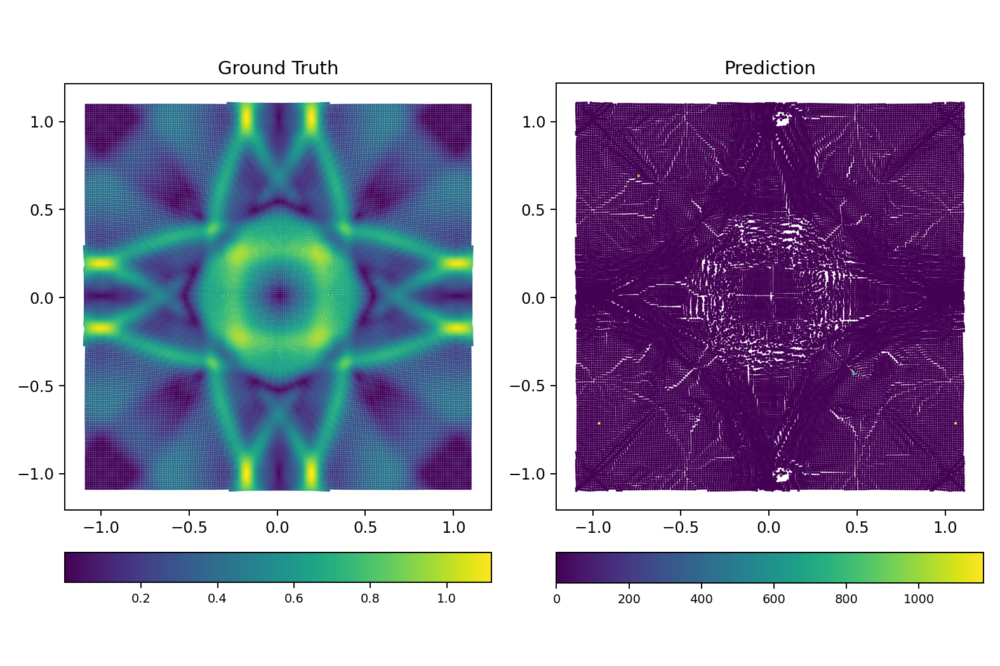

  0%|          | 0/16 [00:00<?, ?it/s]

In [53]:
# out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)

fig, axis = plt.subplots(1, 2, figsize=(9,6), sharex = False, sharey = False, squeeze = False)

def scatter(ax, positions, data, label):
    sc = ax.scatter(positions[:,0], positions[:,1], c = data,s=0.5)
    ax.axis('equal')
    ax.set_title(label)
    ax1_divider = make_axes_locatable(ax)
#     ax.set_xticklabels([])
#     ax.set_yticklabels([])
    cax1 = ax1_divider.append_axes("bottom", size="7%", pad="10%")
    cb1 = fig.colorbar(sc, cax=cax1,orientation='horizontal')
    cb1.ax.tick_params(labelsize=8) 

    
for i in tqdm(range(16)):
    basepositions, baseFeatures, baseOutput, baseGhostIndices, baseBatches, basePBatches, base_gt, _, bIndices = prepareData([f], dataset, device)
    
    out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)
#     positions = torch.clone(basepositions)
#     features = torch.clone(baseFeatures)
    cPos = positions.detach().cpu()
    bPos = basepositions.detach().cpu()
    
#     debugPrint(out)
#     debugPrint(base_gt)
#     debugPrint(torch.mean(1 - base_gt/out))
    
    positions[:,:2] += out /50 * support
    features[:,1:] = out /50 * support / dt

    filteredPositions, filteredFeatures, filterIndices = filterVirtualParticles(positions, features)
    positions, features, persistent_output, ghostIndices, batches, persistent_batches, bindices, support, bches= createGhostParticles(filteredPositions, filteredFeatures)
    f = f + 1
    

scatter(axis[0,0], bPos, torch.linalg.norm(base_gt,axis=1).detach().cpu(), 'Ground Truth')
scatter(axis[0,1], cPos, torch.linalg.norm(out,axis=1).detach().cpu(), 'Prediction')

fig.tight_layout()

<IPython.core.display.Javascript object>


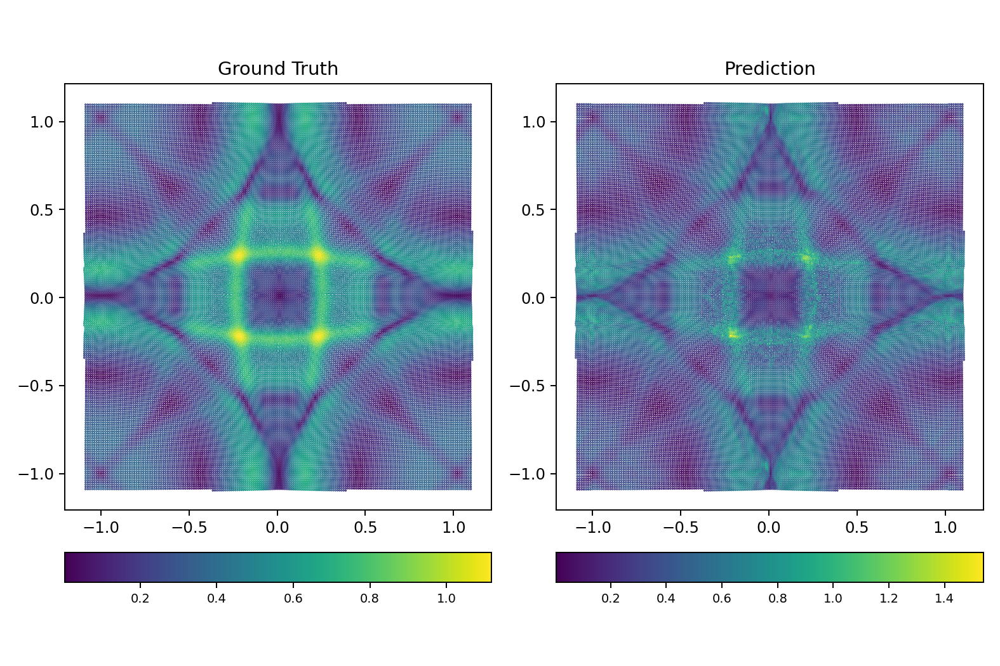

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:01<00:00,  2.95it/s]


In [105]:
# out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)

fig, axis = plt.subplots(1, 2, figsize=(9,6), sharex = False, sharey = False, squeeze = False)

def scatter(ax, positions, data, label):
    sc = ax.scatter(positions[:,0], positions[:,1], c = data,s=0.25)
    ax.axis('equal')
    ax.set_title(label)
    ax1_divider = make_axes_locatable(ax)
#     ax.set_xticklabels([])
#     ax.set_yticklabels([])
    cax1 = ax1_divider.append_axes("bottom", size="7%", pad="10%")
    cb1 = fig.colorbar(sc, cax=cax1,orientation='horizontal')
    cb1.ax.tick_params(labelsize=8) 

    
for i in tqdm(range(4)):
    basepositions, baseFeatures, baseOutput, baseGhostIndices, baseBatches, basePBatches, base_gt, _, bIndices = prepareData([f], dataset, device)
    
    out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)
#     positions = torch.clone(basepositions)
#     features = torch.clone(baseFeatures)
    cPos = positions.detach().cpu()
    bPos = basepositions.detach().cpu()
    
#     debugPrint(out)
#     debugPrint(base_gt)
#     debugPrint(torch.mean(1 - base_gt/out))
    
    positions[:,:2] += out /50 * support
    features[:,1:] = out /50 * support / dt

    filteredPositions, filteredFeatures, filterIndices = filterVirtualParticles(positions, features)
    positions, features, persistent_output, ghostIndices, batches, persistent_batches, bindices, support, bches= createGhostParticles(filteredPositions, filteredFeatures)
    f = f + 1
    

scatter(axis[0,0], bPos, torch.linalg.norm(base_gt,axis=1).detach().cpu(), 'Ground Truth')
scatter(axis[0,1], cPos, torch.linalg.norm(out,axis=1).detach().cpu(), 'Prediction')

fig.tight_layout()

In [265]:
print(out.shape)
print(cPos.shape)

torch.Size([35069, 2])
torch.Size([35085, 3])


In [180]:
# timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
# imageFolder = '/home/winchenbach/Desktop/' + timestamp

# if not os.path.exists(imageFolder):
#     os.makedirs(imageFolder)
# from IPython.display import clear_output

# for i in tqdm(range(len(dataloader))):
# for i in tqdm(range(25)):
#     if i%25 == 0:
#         positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([i], dataset, device)
out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)

# fig, axis = plt.subplots(1, 2, figsize=(9,6), sharex = False, sharey = False, squeeze = False)

# def scatter(ax, positions, data, label):
#     sc = ax.scatter(positions[:,0], positions[:,1], c = data,s=0.25)
#     ax.axis('equal')
#     ax.set_title(label)
#     ax1_divider = make_axes_locatable(ax)
# #     ax.set_xticklabels([])
# #     ax.set_yticklabels([])
#     cax1 = ax1_divider.append_axes("bottom", size="7%", pad="10%")
#     cb1 = fig.colorbar(sc, cax=cax1,orientation='horizontal')
#     cb1.ax.tick_params(labelsize=8) 

basepositions, baseFeatures, baseOutput, baseGhostIndices, baseBatches, basePBatches, base_gt, _, bIndices = prepareData([f], dataset, device)

cPos = positions.detach().cpu()
bPos = basepositions.detach().cpu()

# scatter(axis[0,0], bPos, torch.linalg.norm(base_gt,axis=1).detach().cpu(), 'Ground Truth')
# scatter(axis[0,1], cPos, torch.linalg.norm(out,axis=1).detach().cpu(), 'Prediction')

# fig.tight_layout()



positions = torch.clone(basepositions)
features = torch.clone(baseFeatures)

positions[:,:2] += base_gt / 50 * support
features[:,1:] = base_gt / 50 * support / dt

filteredPositions, filteredFeatures, filterIndices = filterVirtualParticles(positions, features)
# print(filteredPositions.shape, filteredFeatures.shape)
positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = createGhostParticles(filteredPositions, filteredFeatures)



# positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = \
#     advanceData(positions, base_gt)
# print('0', positions.shape, positions)
# print('1', features.shape, features)
# print('2', persistent_output.shape, persistent_output)
# print('3', ghostIndices[ghostIndices!=-1].shape, ghostIndices[ghostIndices!=-1])
# print('4', batches.shape, batches)
# print('5', persistent_batches.shape, persistent_batches)


# print('0', basepositions.shape, basepositions)
# print('1', baseFeatures.shape, baseFeatures)
# print('2', baseOutput.shape, baseOutput)
# print('3', baseGhostIndices[baseGhostIndices!=-1].shape, baseGhostIndices[baseGhostIndices!=-1])
# print('4', baseBatches.shape, baseBatches)
# print('5', basePBatches.shape, basePBatches)


print('2', baseOutput.shape, torch.sum(persistent_output - baseOutput))
print('3', baseGhostIndices.shape, torch.sum(ghostIndices - baseGhostIndices))

print('0', basepositions.shape, torch.sum(positions - basepositions))
print('1', baseFeatures.shape, torch.sum(features - baseFeatures))
print('4', baseBatches.shape, torch.sum(batches - baseBatches))
print('5', basePBatches.shape, torch.sum(persistent_batches - basePBatches))

# print(support)

# print('0', positions.shape, positions)
# print('1', features.shape, features)
# print('2', persistent_output.shape, persistent_output)
# print('3', ghostIndices.shape, ghostIndices)
# print('4', batches.shape, batches)
# print('5', persistent_batches.shape, persistent_batches)


# f = f + 1
#     imagePath = imageFolder + ('/%04d.png' % i)
#     plt.savefig(imagePath, dpi = 200)
#     plt.clf()
#     clear_output(wait = True)

2 torch.Size([29725, 3]) tensor(2.9802e-07, device='cuda:0')
3 torch.Size([35389]) tensor(0., device='cuda:0')
0 torch.Size([35389, 3]) tensor(0.0016, device='cuda:0')
1 torch.Size([35389, 3]) tensor(0.1670, device='cuda:0')
4 torch.Size([35389]) tensor(0., device='cuda:0')
5 torch.Size([29725]) tensor(0., device='cuda:0')


<IPython.core.display.Javascript object>


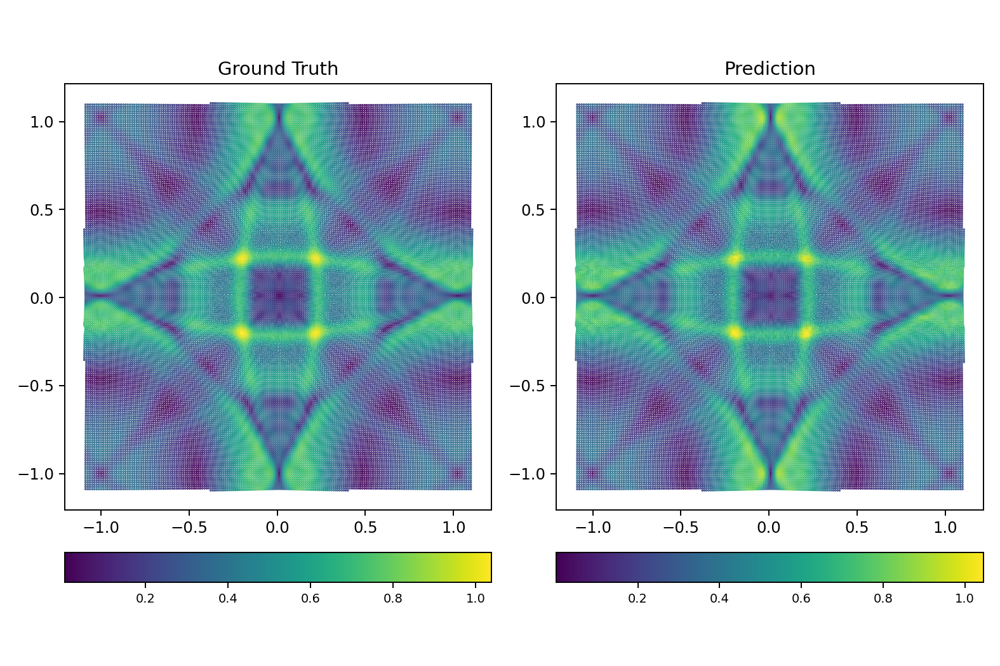

In [30]:
f = 320
dt =0.005
positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = prepareData([f], dataset, device)

out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)

fig, axis = plt.subplots(1, 2, figsize=(9,6), sharex = False, sharey = False, squeeze = False)

def scatter(ax, positions, data, label):
    sc = ax.scatter(positions[:,0], positions[:,1], c = data,s=0.25)
    ax.axis('equal')
    ax.set_title(label)
    ax1_divider = make_axes_locatable(ax)
#     ax.set_xticklabels([])
#     ax.set_yticklabels([])
    cax1 = ax1_divider.append_axes("bottom", size="7%", pad="10%")
    cb1 = fig.colorbar(sc, cax=cax1,orientation='horizontal')
    cb1.ax.tick_params(labelsize=8) 
    
basepositions, _, _, _, _, _, base_gt, _, _ = prepareData([f], dataset, device)
    
cPos = positions.detach().cpu()
bPos = basepositions.detach().cpu()
scatter(axis[0,0], bPos, torch.linalg.norm(base_gt,axis=1).detach().cpu(), 'Ground Truth')
scatter(axis[0,1], cPos, torch.linalg.norm(out,axis=1).detach().cpu(), 'Prediction')

fig.tight_layout()


<IPython.core.display.Javascript object>


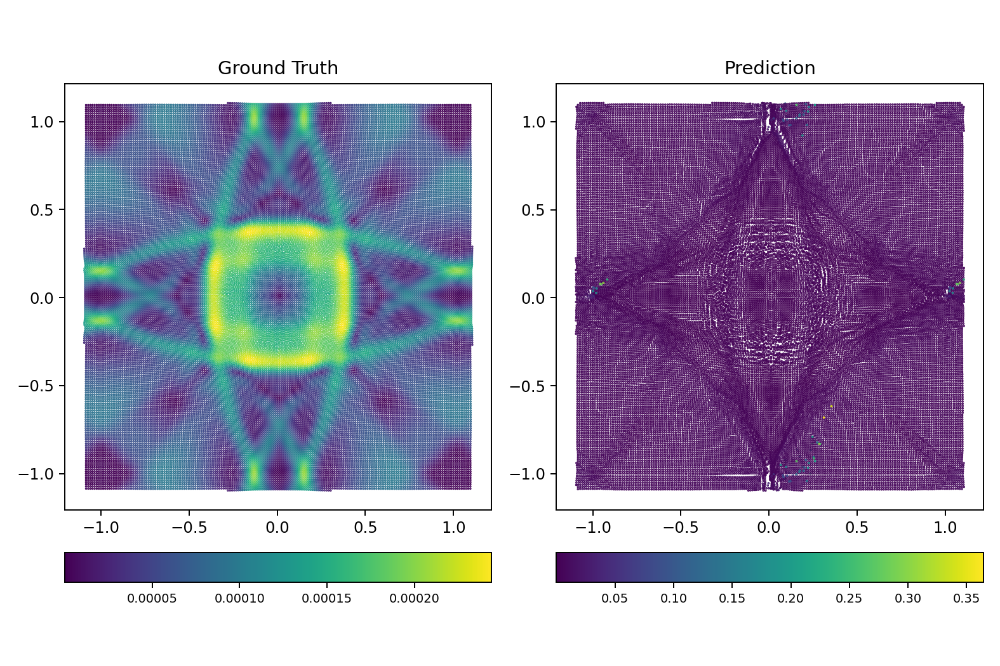

In [46]:
out = model(positions, features, persistent_output, ghostIndices, support, batches, persistent_batches)

fig, axis = plt.subplots(1, 2, figsize=(9,6), sharex = False, sharey = False, squeeze = False)

def scatter(ax, positions, data, label):
    sc = ax.scatter(positions[:,0], positions[:,1], c = data,s=0.25)
    ax.axis('equal')
    ax.set_title(label)
    ax1_divider = make_axes_locatable(ax)
#     ax.set_xticklabels([])
#     ax.set_yticklabels([])
    cax1 = ax1_divider.append_axes("bottom", size="7%", pad="10%")
    cb1 = fig.colorbar(sc, cax=cax1,orientation='horizontal')
    cb1.ax.tick_params(labelsize=8) 
    
basepositions, _, _, _, _, _, base_gt, _, _ = prepareData([f], dataset, device)
    
cPos = positions.detach().cpu()
bPos = basepositions.detach().cpu()
scatter(axis[0,0], bPos, torch.linalg.norm(base_gt * support * dt,axis=1).detach().cpu(), 'Ground Truth')
scatter(axis[0,1], cPos, torch.linalg.norm((out - positions[:,:2]) * dt,axis=1).detach().cpu(), 'Prediction')
# scatter(axis[0,2], cPos, torch.linalg.norm(((out - positions[:,:2]) * dt - (gt - positions[:,:2]) * dt)**2 / 2,axis=1).detach().cpu(), 'Loss')

fig.tight_layout()

# print(positions.shape)
# print(features.shape)
# print(persistent_output.shape)
# print(ghostIndices.shape)
# print(batches.shape)

# print(ghostIndices)

positions, features, persistent_output, ghostIndices, batches, persistent_batches, gt, support, batchIndices = advanceData(positions, out)

# print(ghostIndices)
# print(positions.shape)
# print(features.shape)
# print(persistent_output.shape)
# print(ghostIndices.shape)
# print(batches.shape)

f = f + 1

In [42]:
print(ghostIndices.dtype)

torch.float32


In [ ]:
indices = torch.arange(updatedPositions.shape[0]).to(device)
virtualMin = [-1.00595093332257,  -1.00595093332257]
virtualMax = [ 1.0173663963512174, 1.0173663963512174]
indices[updatedPositions[:,0] < virtualMin[0]] = -1
indices[updatedPositions[:,1] < virtualMin[1]] = -1
indices[updatedPositions[:,0] > virtualMax[0]] = -1
indices[updatedPositions[:,1] > virtualMax[1]] = -1

indices = indices[indices != -1]

actualPositions = updatedPositions[indices]

updatedFeatures = torch.clone(features)
updatedFeatures[:,1:] = predicted_velocity
actualFeatures = updatedFeatures[indices]

ghostIndices = actualPositions.new_ones(indices.shape[0]) * -1


# ghostIndices[ghostIndices != -1].shape

In [ ]:
mask_xp = actualPositions[:,0] > virtualMax[0] - 2 * support
mask_xn = actualPositions[:,0] < virtualMin[0] + 2 * support
mask_yp = actualPositions[:,1] > virtualMax[1] - 2 * support
mask_yn = actualPositions[:,1] < virtualMin[1] + 2 * support

filter_xp = indices[mask_xp]
filter_xn = indices[mask_xn]
filter_yp = indices[mask_yp]
filter_yn = indices[mask_yn]

filter_xp_yp = indices[torch.logical_and(mask_xp, mask_yp)]
filter_xp_yn = indices[torch.logical_and(mask_xp, mask_yn)]
filter_xn_yp = indices[torch.logical_and(mask_xn, mask_yp)]
filter_xn_yn = indices[torch.logical_and(mask_xn, mask_yn)]


In [ ]:
ghosts_xp = actualPositions[filter_xp,:]
ghosts_xp[:,0] -=  virtualMax[0] - virtualMin[0]

ghosts_yp = actualPositions[filter_yp,:]
ghosts_yp[:,1] -=  virtualMax[1] - virtualMin[1]

ghosts_xn = actualPositions[filter_xn,:]
ghosts_xn[:,0] +=  virtualMax[0] - virtualMin[0]

ghosts_yn = actualPositions[filter_yn,:]
ghosts_yn[:,1] +=  virtualMax[1] - virtualMin[1]


ghosts_xp_yp = actualPositions[filter_xp_yp,:]
ghosts_xp_yp[:,0] -=  virtualMax[0] - virtualMin[0]
ghosts_xp_yp[:,1] -=  virtualMax[0] - virtualMin[0]

ghosts_xp_yn = actualPositions[filter_xp_yn,:]
ghosts_xp_yn[:,0] -=  virtualMax[0] - virtualMin[0]
ghosts_xp_yn[:,1] +=  virtualMax[0] - virtualMin[0]

ghosts_xn_yp = actualPositions[filter_xn_yp,:]
ghosts_xn_yp[:,0] +=  virtualMax[0] - virtualMin[0]
ghosts_xn_yp[:,1] -=  virtualMax[0] - virtualMin[0]

ghosts_xn_yn = actualPositions[filter_xn_yn,:]
ghosts_xn_yn[:,0] +=  virtualMax[0] - virtualMin[0]
ghosts_xn_yn[:,1] +=  virtualMax[0] - virtualMin[0]

In [ ]:
def stackData(ghosts, mask, oldPositions, oldFeatures, oldIndices):
    tempPositions = torch.vstack((oldPositions, ghosts))
    tempFeatures = torch.vstack((oldFeatures, actualFeatures[mask]))
    tempIndices = torch.cat((oldIndices, indices[mask]))
    
    return tempPositions, tempFeatures, tempIndices

In [ ]:
tempPositions, tempFeatures, tempIndices = stackData(ghosts_xp, filter_xp, actualPositions, actualFeatures, ghostIndices)
tempPositions, tempFeatures, tempIndices = stackData(ghosts_xn, filter_xn, tempPositions, tempFeatures, tempIndices)
tempPositions, tempFeatures, tempIndices = stackData(ghosts_yp, filter_yp, tempPositions, tempFeatures, tempIndices)
tempPositions, tempFeatures, tempIndices = stackData(ghosts_yn, filter_yn, tempPositions, tempFeatures, tempIndices)

tempPositions, tempFeatures, tempIndices = stackData(ghosts_xp_yp, filter_xp_yp, tempPositions, tempFeatures, tempIndices)
tempPositions, tempFeatures, tempIndices = stackData(ghosts_xp_yn, filter_xp_yn, tempPositions, tempFeatures, tempIndices)
tempPositions, tempFeatures, tempIndices = stackData(ghosts_xn_yp, filter_xn_yp, tempPositions, tempFeatures, tempIndices)
tempPositions, tempFeatures, tempIndices = stackData(ghosts_xn_yn, filter_xn_yn, tempPositions, tempFeatures, tempIndices)


In [ ]:
updated_cpu = actualPositions.detach().cpu()

fig, axis = plt.subplots(1,1, figsize=(6,6), sharex = True, sharey = True, squeeze = False)

axis[0,0].scatter(updated_cpu[:,0], updated_cpu[:,1],s=1)

ghosts_xp = updated_cpu[filter_xp,:]
ghosts_xp[:,0] -=  virtualMax[0] - virtualMin[0]
axis[0,0].scatter(ghosts_xp[:,0], ghosts_xp[:,1],s=1)

ghosts_yp = updated_cpu[filter_yp,:]
ghosts_yp[:,1] -=  virtualMax[1] - virtualMin[1]
axis[0,0].scatter(ghosts_yp[:,0], ghosts_yp[:,1],s=1)

ghosts_xn = updated_cpu[filter_xn,:]
ghosts_xn[:,0] +=  virtualMax[0] - virtualMin[0]
axis[0,0].scatter(ghosts_xn[:,0], ghosts_xn[:,1],s=1)

ghosts_yn = updated_cpu[filter_yn,:]
ghosts_yn[:,1] +=  virtualMax[1] - virtualMin[1]
axis[0,0].scatter(ghosts_yn[:,0], ghosts_yn[:,1],s=1)


ghosts_xp_yp = updated_cpu[filter_xp_yp,:]
ghosts_xp_yp[:,0] -=  virtualMax[0] - virtualMin[0]
ghosts_xp_yp[:,1] -=  virtualMax[0] - virtualMin[0]
axis[0,0].scatter(ghosts_xp_yp[:,0], ghosts_xp_yp[:,1],s=1)

ghosts_xp_yn = updated_cpu[filter_xp_yn,:]
ghosts_xp_yn[:,0] -=  virtualMax[0] - virtualMin[0]
ghosts_xp_yn[:,1] +=  virtualMax[0] - virtualMin[0]
axis[0,0].scatter(ghosts_xp_yn[:,0], ghosts_xp_yn[:,1],s=1)

ghosts_xn_yp = updated_cpu[filter_xn_yp,:]
ghosts_xn_yp[:,0] +=  virtualMax[0] - virtualMin[0]
ghosts_xn_yp[:,1] -=  virtualMax[0] - virtualMin[0]
axis[0,0].scatter(ghosts_xn_yp[:,0], ghosts_xn_yp[:,1],s=1)

ghosts_xn_yn = updated_cpu[filter_xn_yn,:]
ghosts_xn_yn[:,0] +=  virtualMax[0] - virtualMin[0]
ghosts_xn_yn[:,1] +=  virtualMax[0] - virtualMin[0]
axis[0,0].scatter(ghosts_xn_yn[:,0], ghosts_xn_yn[:,1],s=1)